**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [2]:
!curl -L -o cat.png https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png
!curl -L -o lenna.png https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
!curl -L -o baboon.png https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
 24  647k   24  159k    0     0  77484      0  0:00:08  0:00:02  0:00:06 77550
 55  647k   55  361k    0     0   111k      0  0:00:05  0:00:03  0:00:02  111k
100  647k  100  647k    0     0   186k      0  0:00:03  0:00:03 --:--:--  186k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
 17  462k   17 81467    0     0  53001      0  0:0

We will be using these imported functions in the lab:


In [ ]:
import matplotlib.pyplot as plt #Vẽ đồ thị
from PIL import Image
import numpy as np #Thư viện xử lý mảng

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


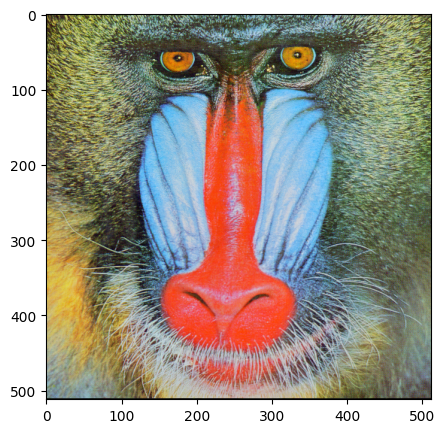

In [5]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5)) #Tạo figure kích thước 5x5
plt.imshow(baboon)
plt.show()

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [6]:
A = baboon #Gán ảnh baboon cho biến A

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [ ]:
id(A) == id(baboon) #Kiểm tra A và baboon có cùng địa chỉ bộ nhớ không

True

However, if we apply method `copy()`, their memory addresses are different.


In [ ]:
B = baboon.copy() #Tạo 1 bản sao của mảng baboon
id(B)==id(baboon) #Kiểm tra B và baboon có cùng địa chỉ bộ nhớ không

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [ ]:
baboon[:,:,] = 0 #Gán tất cả pixel của ảnh baboon thành 0 (đen)

We can compare the variables <code>baboon</code> and array <code>A</code>:


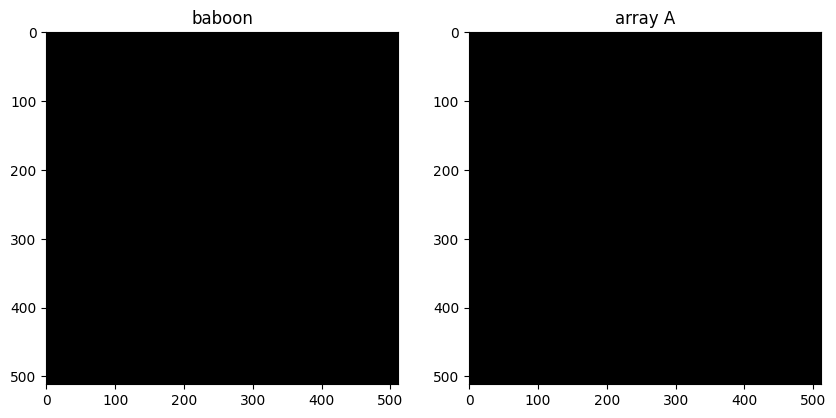

In [ ]:
plt.figure(figsize=(10,10)) #Tạo figure kích thước 10x10

#Hiển thị ảnh baboon
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
#Hiển thị ảnh A
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


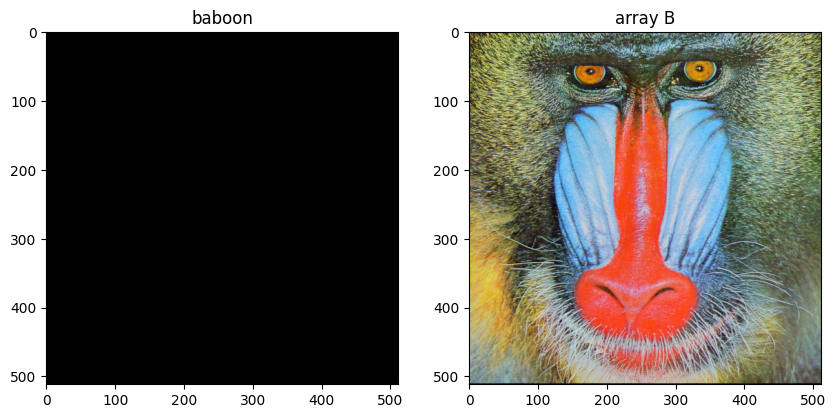

In [ ]:
plt.figure(figsize=(10,10))

#Hiển thị ảnh baboon
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
#Hiển thị ảnh B
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


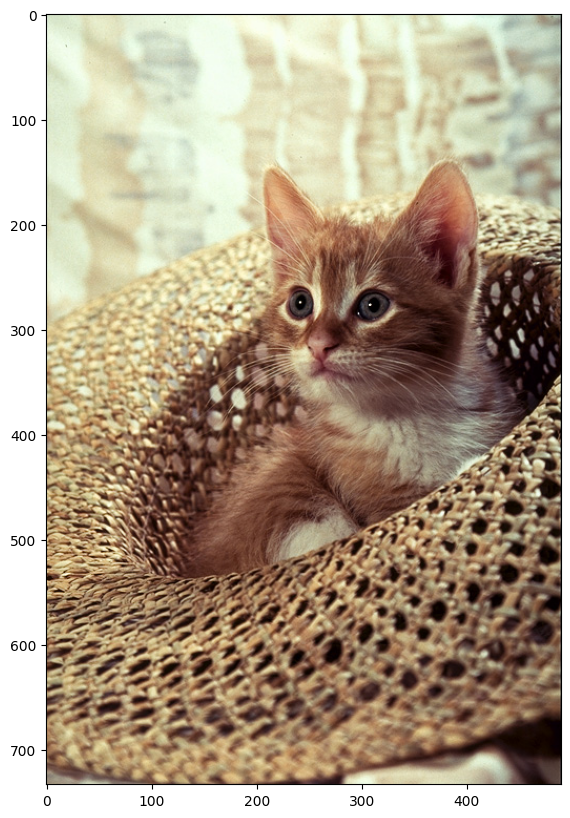

In [12]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

We can cast it to an array and find its shape:


In [ ]:
array = np.array(image) #Chuyển ảnh sang mảng numpy
width, height, C = array.shape #Lấy kích thước ảnh: width, height, channels
print('width, height, C', width, height, C)

width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) #Tạo mảng numpy rỗng với cùng kích thước giống ảnh gốc

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [ ]:
for i,row in enumerate(array):
    #Gán giá trị của hàng i từ ảnh gốc vào hàng (width-1-i) của ảnh mới để lật ảnh theo chiều ngang
    array_flip[width - 1 - i, :, :] = row

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [ ]:
from PIL import ImageOps #Import thư viện ImageOps để sử dụng các phép biến đổi ảnh 

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


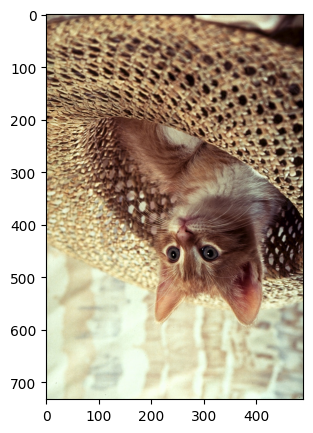

In [ ]:
im_flip = ImageOps.flip(image) #Lật ảnh theo chiều dọc 
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

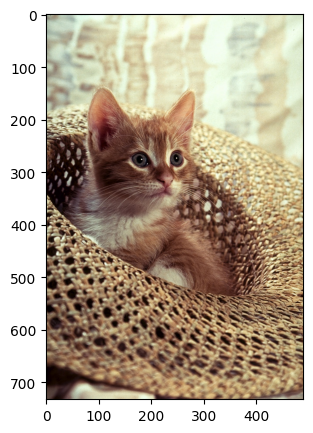

In [ ]:
im_mirror = ImageOps.mirror(image) #Lật ảnh theo chiều ngang
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


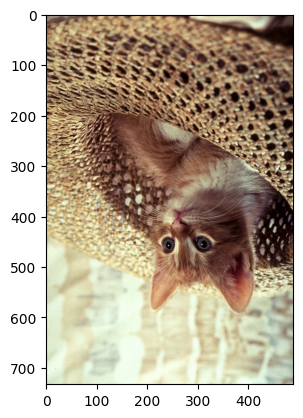

In [ ]:
im_flip = image.transpose(1) #Lật ảnh theo chiều ngang sử dụng phương thức transpose
plt.imshow(im_flip)
plt.show()

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT, #Lật ảnh trái-phải
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM, #Lật ảnh trên-dưới
        "ROTATE_90": Image.ROTATE_90, #Xoay ảnh 90 độ
        "ROTATE_180": Image.ROTATE_180, #Xoay ảnh 180 độ
        "ROTATE_270": Image.ROTATE_270, #Xoay ảnh 270 độ
        "TRANSPOSE": Image.TRANSPOSE,  #Lật ảnh sử dụng phương thức transpose
        "TRANSVERSE": Image.TRANSVERSE} #Lật ảnh sử dụng phương thức transverse

We see the values are integers.


In [21]:
flip["FLIP_LEFT_RIGHT"]

0

We can plot each of the outputs using the different  parameter values:


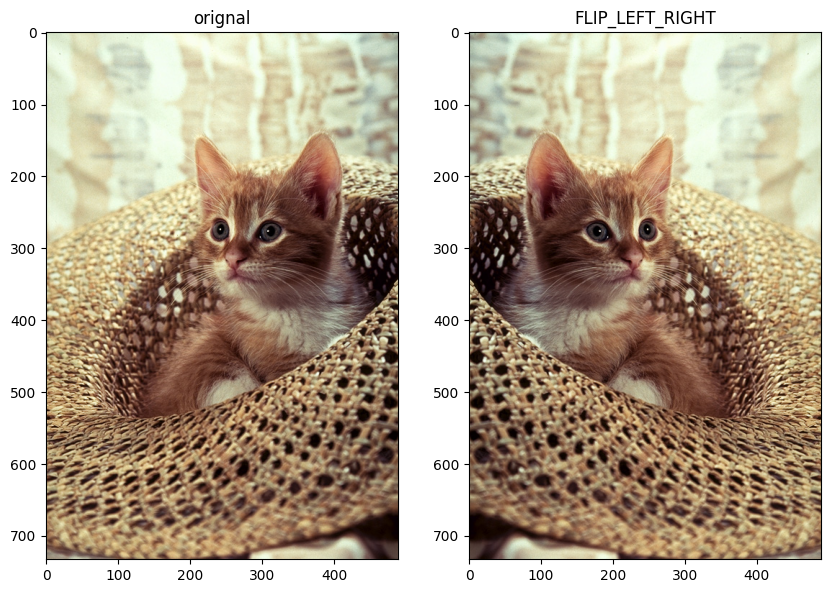

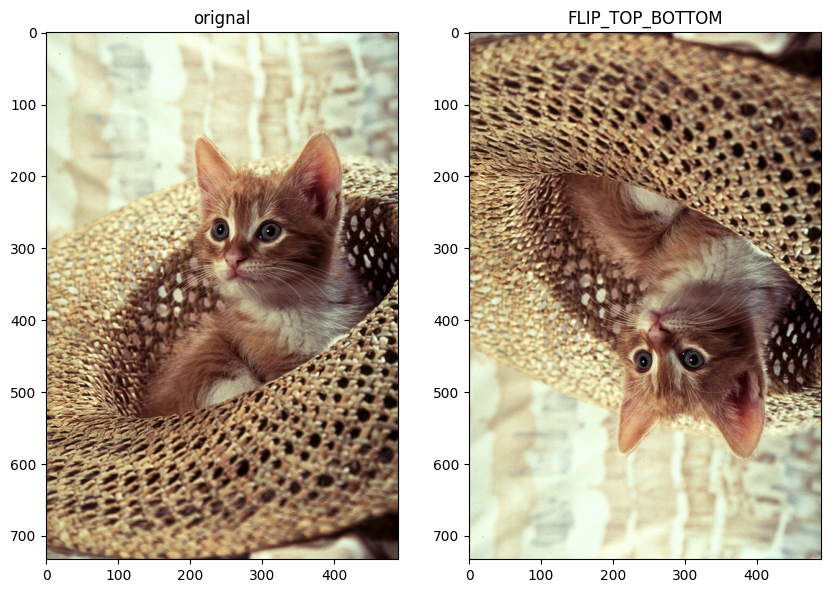

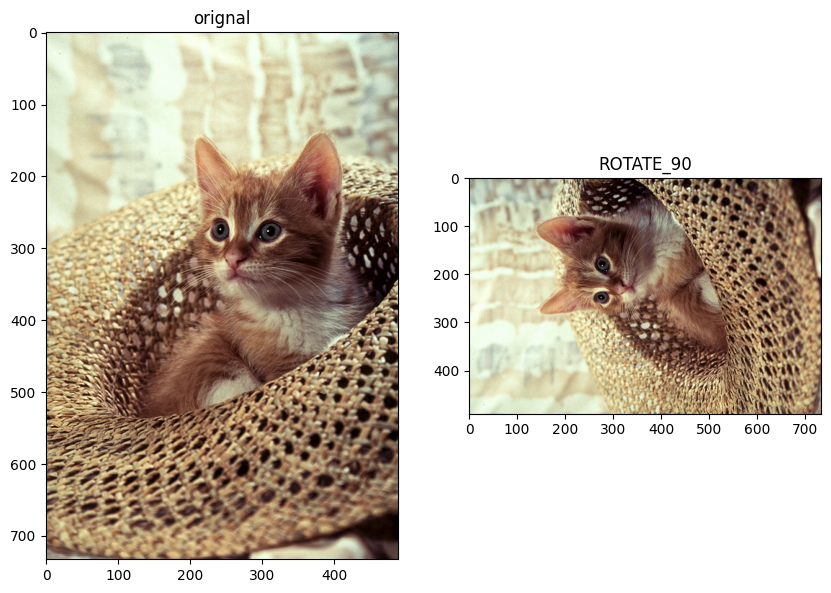

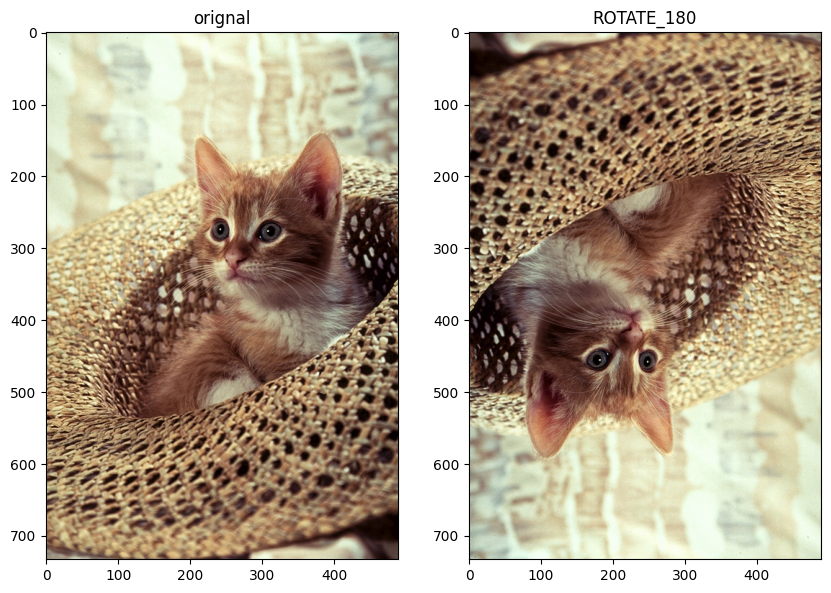

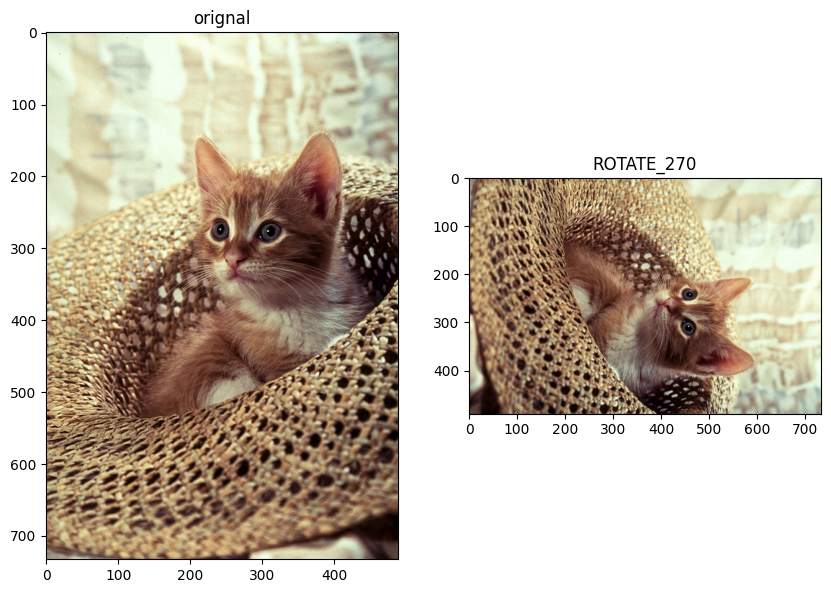

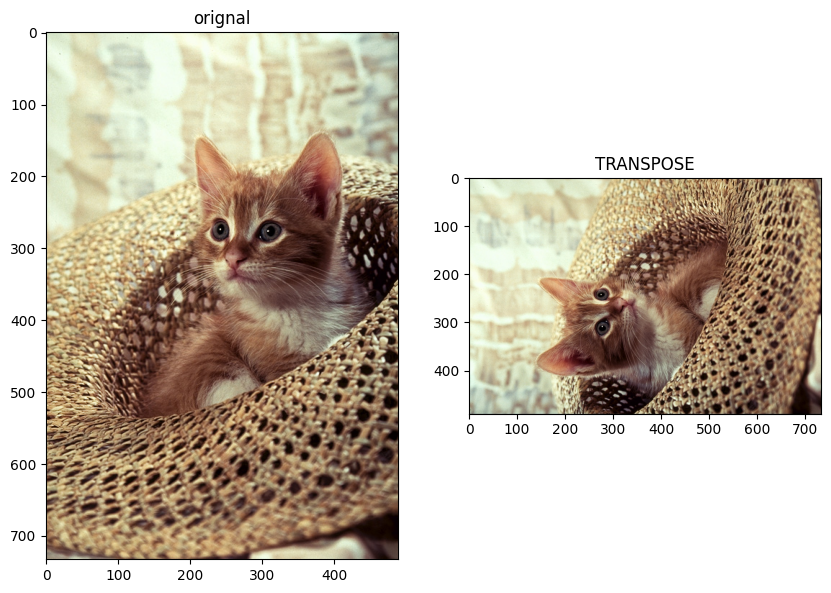

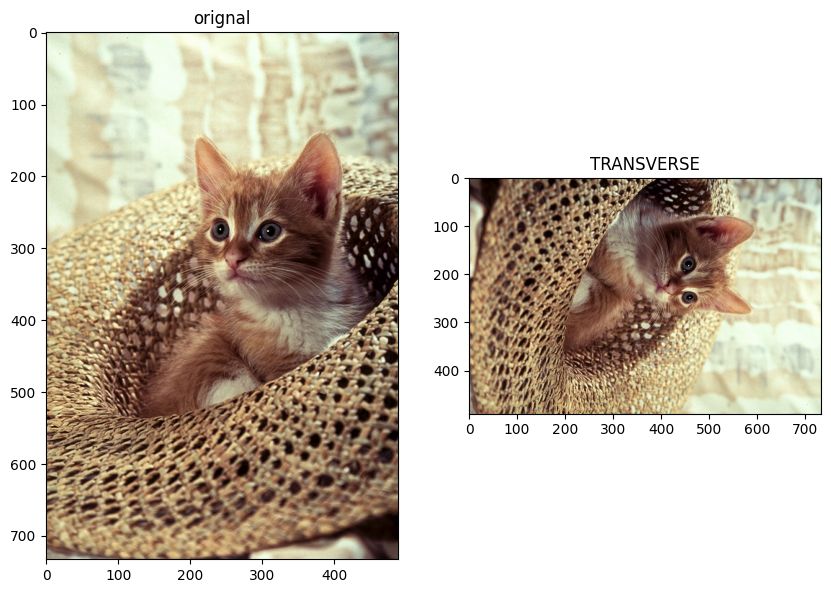

In [ ]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))

    #Hiển thị ảnh gốc
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    #Hiển thị ảnh đã biến đổi
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


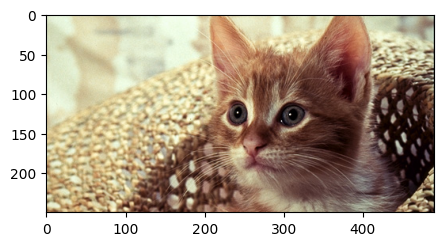

In [ ]:
#Xác định vùng cắt của ảnh 
upper = 150
lower = 400

#Cắt ảnh theo trục dọc từ upper đến lower
crop_top = array[upper: lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


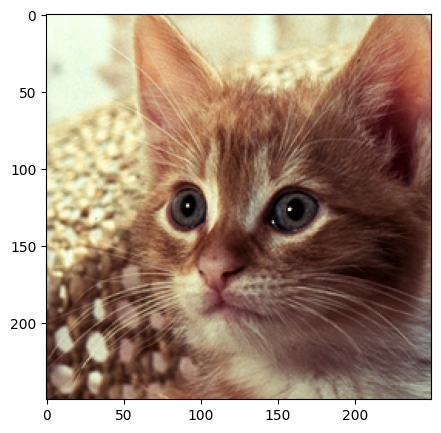

In [ ]:
left = 150
right = 400

#Cắt ảnh theo trục ngang từ left đến right
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


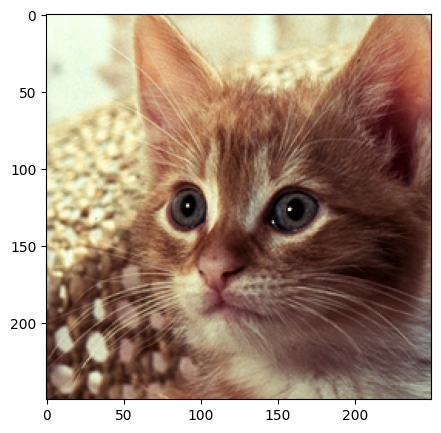

In [ ]:
image = Image.open("cat.png")

#Cắt ảnh sử dụng phương thức crop của PIL
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

We can also flip the new image:


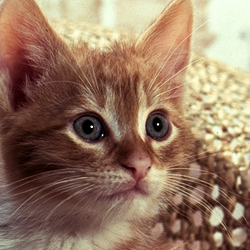

In [ ]:
#Lật ảnh đã crop theo chiều trái - phải
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [ ]:
array_sq = np.copy(array) #Tạo bản sao của ảnh gốc

#Đặt giá trị của kênh màu xanh lá và xanh dương trong vùng cắt thành 0
array_sq[upper:lower, left:right, 1:3] = 0

We can compare the results with the new image. 


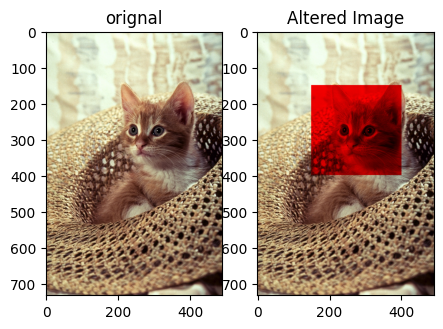

In [ ]:
plt.figure(figsize=(5,5))

#Hiển thị ảnh gốc
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")

#Hiển thị ảnh đã biến đổi
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [ ]:
from PIL import ImageDraw #Import thư viện ImageDraw 

We will copy the image object:


In [30]:
image_draw = image.copy()

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
# Tạo đối tượng ImageDraw để vẽ lên ảnh image_draw
image_fn = ImageDraw.Draw(im=image_draw)

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower] #Xác định tọa độ HCN
image_fn.rectangle(xy=shape,fill="red") #Vẽ HCN màu đỏ lên vùng đã chọn

We can plot the image.


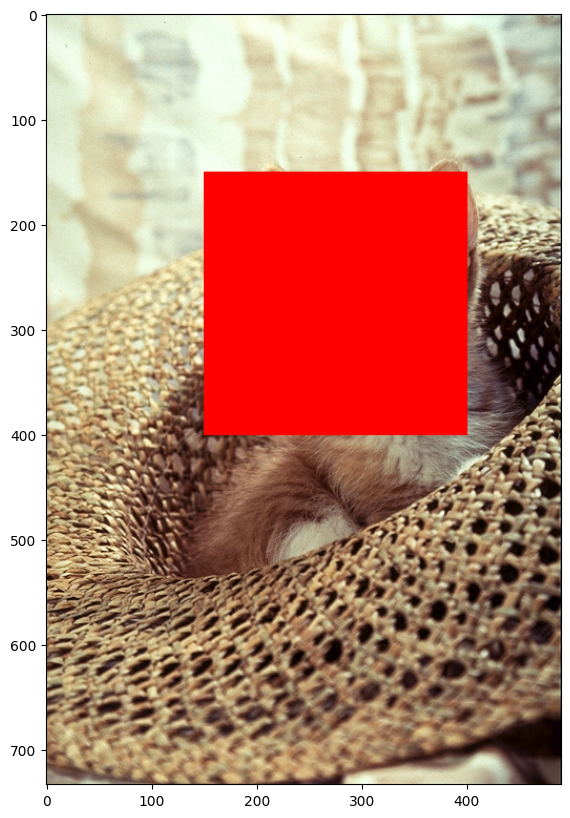

In [33]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [ ]:
from PIL import ImageFont #Import thư viện ImageFont để sử dụng các font chữ

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [ ]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0)) #Vẽ chữ "box" tại vị trí (0,0) với màu đen

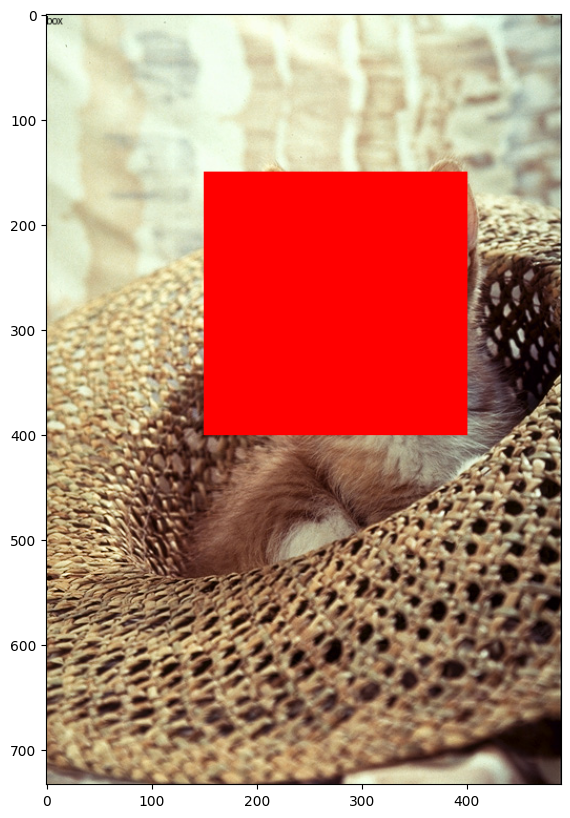

In [36]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [37]:
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

We can reassign the pixel values as follows:


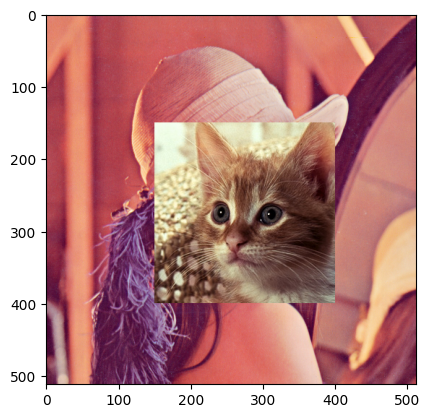

In [ ]:
#Sao chép vùng đã chọn từ ảnh gốc sang ảnh lenna
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left,upper)) #Dán ảnh crop_image vào ảnh lenna tại vị trí (left, upper)

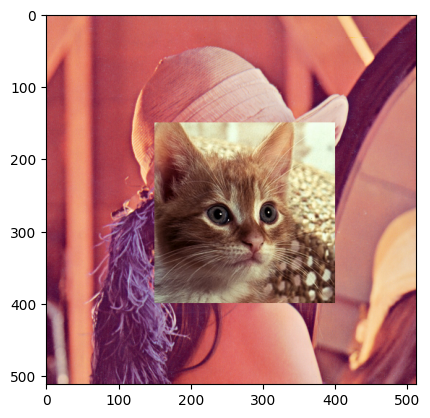

In [40]:
plt.imshow(image_lenna)
plt.show()

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
image = Image.open("cat.png") #Mở ảnh cat.png
new_image=image
copy_image=image.copy()

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [ ]:
id(image)==id(new_image) #Kiểm tra image và new_image có cùng địa chỉ bộ nhớ không

True

If we use the method <code>copy()</code>, the address is different:


In [ ]:
id(image)==id(copy_image) #Kiểm tra image và copy_image có cùng địa chỉ bộ nhớ không

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [45]:
image_fn= ImageDraw.Draw(im=image) # Tạo đối tượng ImageDraw để vẽ lên ảnh image
image_fn.text(xy=(0,0),text="box",fill=(0,0,0)) #Vẽ chữ "box" tại vị trí (0,0) với màu đen
image_fn.rectangle(xy=shape,fill="red") #Vẽ HCN màu đỏ lên vùng đã chọn

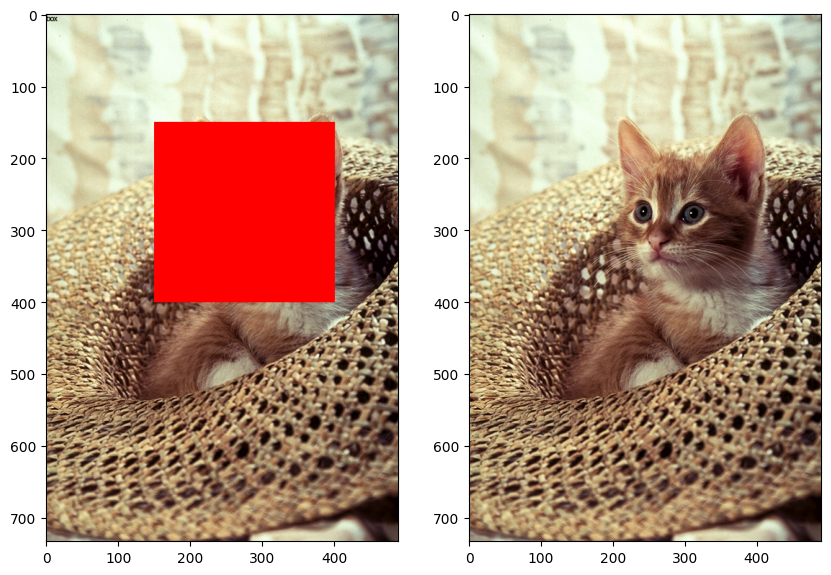

In [ ]:
plt.figure(figsize=(10,10))

#Hiển thị ảnh new_image (tham chiếu image)
plt.subplot(121)
plt.imshow(new_image)
#Hiển thị ảnh copy_image (bản sao của image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


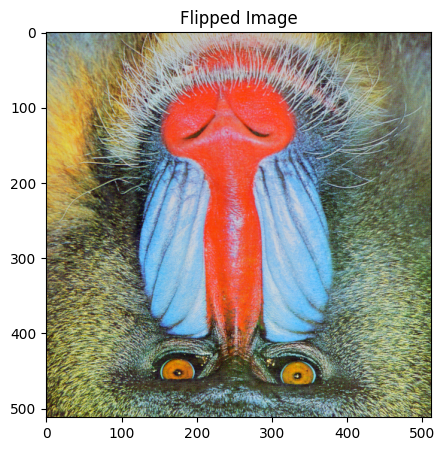

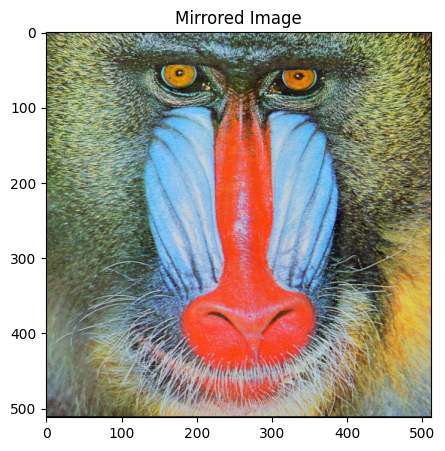

In [51]:
# write your script here
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

#Mở ảnh baboon.png
im = Image.open("baboon.png")

#Lật ảnh theo chiều dọc (top-bottom)
im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.title("Flipped Image")
plt.show()

#Lật ảnh theo chiều ngang (left-right)
im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.title("Mirrored Image")
plt.show()


### Công nghệ sử dụng
- **PIL (Pillow)**: mở ảnh và thực hiện các phép biến đổi ảnh
- **ImageOps**: cung cấp sẵn các hàm lật ảnh
- **Matplotlib**: hiển thị ảnh kết quả

---

### Cách hoạt động

1. Ảnh `baboon.png` được mở bằng `Image.open()` và lưu vào biến `im`.
2. Ảnh được lật theo chiều dọc (trên – dưới) bằng `ImageOps.flip()` và lưu vào `im_flip`.
3. Ảnh được lật theo chiều ngang (trái – phải) bằng `ImageOps.mirror()` và lưu vào `im_mirror`.
4. Hai ảnh sau khi xử lý được hiển thị bằng `matplotlib`.

---

### Kết quả
- `im_flip`: ảnh bị lật theo chiều **top–bottom**
- `im_mirror`: ảnh bị lật theo chiều **left–right**
- Hai ảnh được hiển thị trực quan để so sánh với ảnh gốc

---

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
